<a href="https://colab.research.google.com/github/AriSu2904/gist/blob/main/UTS_Pengolahan_Citra.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [80]:
import cv2
from google.colab import files
file = files.upload()

In [81]:
from google.colab.patches import cv2_imshow
img = cv2.imread("Ari - Enigma Left.jpg")

# Tampilkan gambar dengan warna sebenarnya

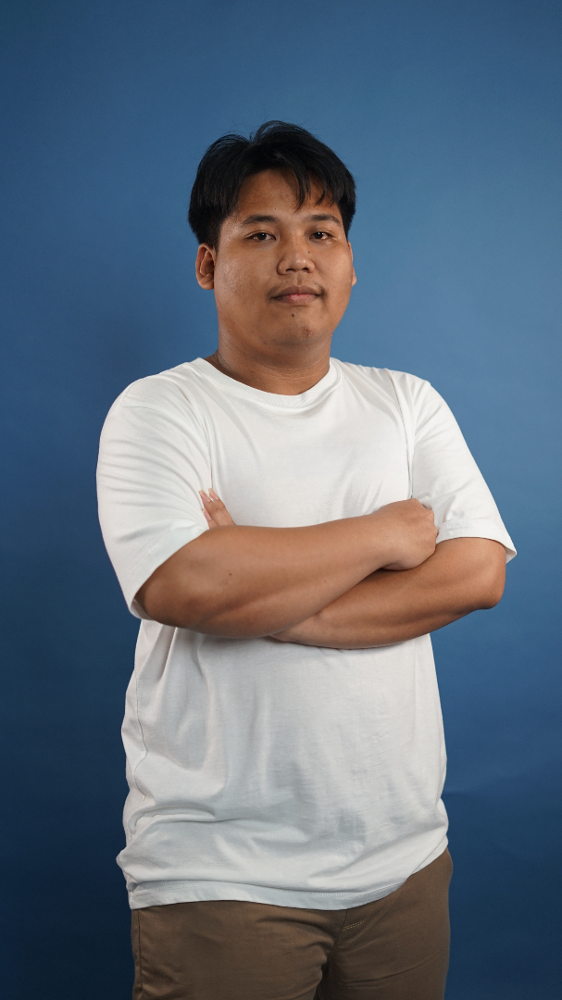

In [82]:
cv2_imshow(img)

# Tampilkan gambar dengan warna grayscale

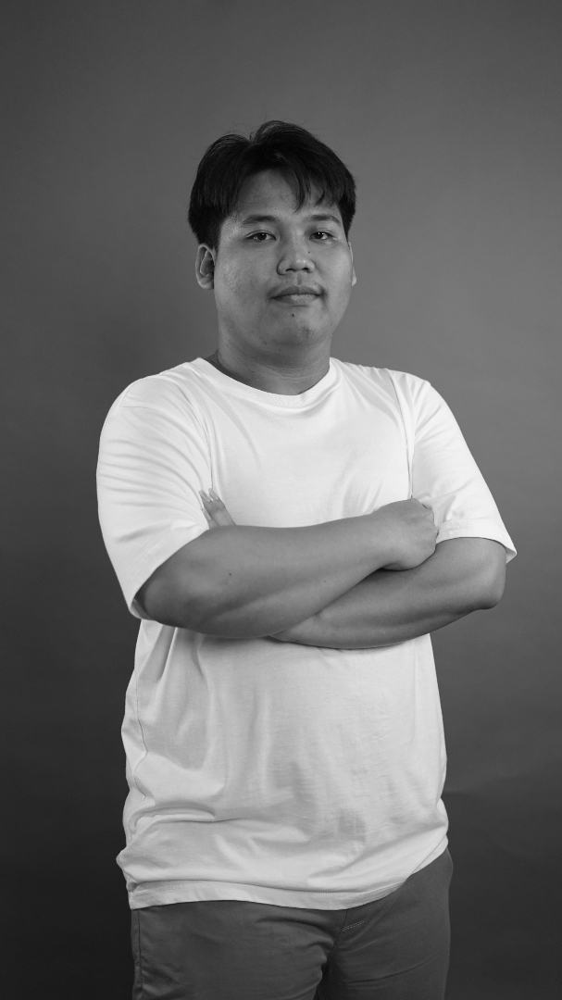

In [83]:
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(img_gray)

# Tampilkan hasil rotasi sebesar 90 derajat searah jarum jam terhadap gambar/citra.

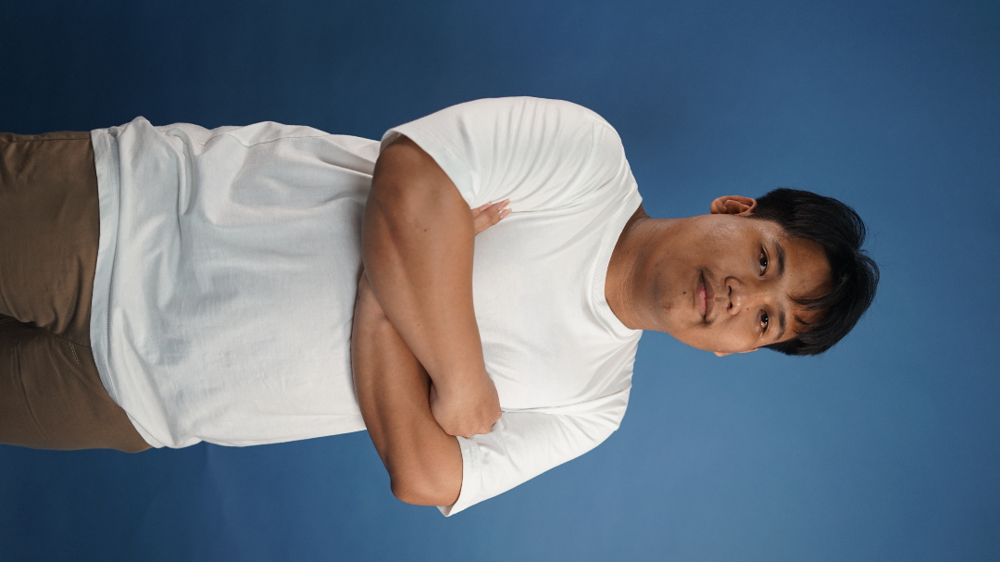

In [84]:
img_rotated = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
cv2_imshow(img_rotated)

# Tampilkan hasil pencerminan terhadap gambar/citra tersebut

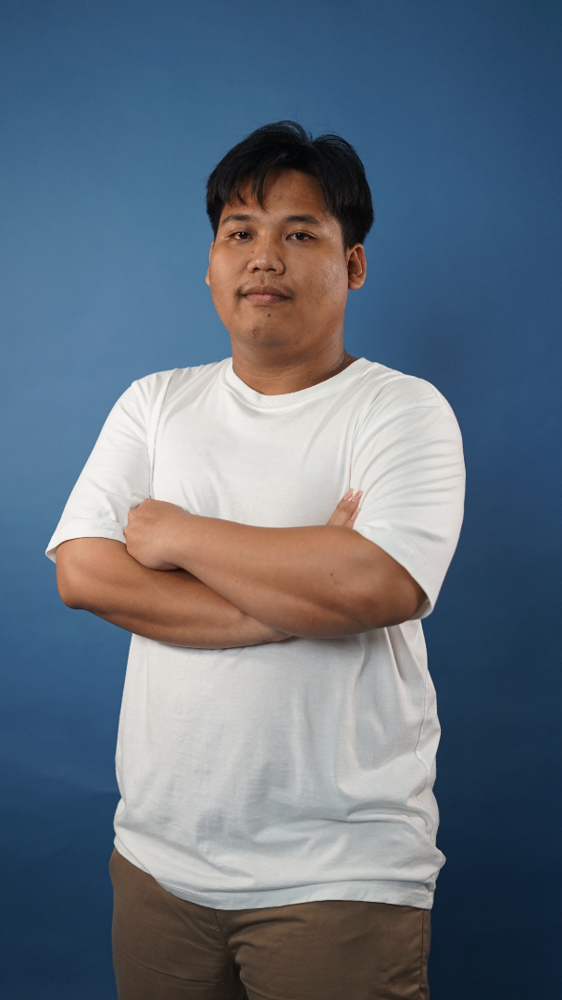

In [85]:
img_mirrored = cv2.flip(img, 1)
cv2_imshow(img_mirrored)

# Tampilkan hasil resize gambar/citra tersebut sehingga ukurannya menjadi 2 kali lipat dari ukuran gambar/citra sebenarnya.

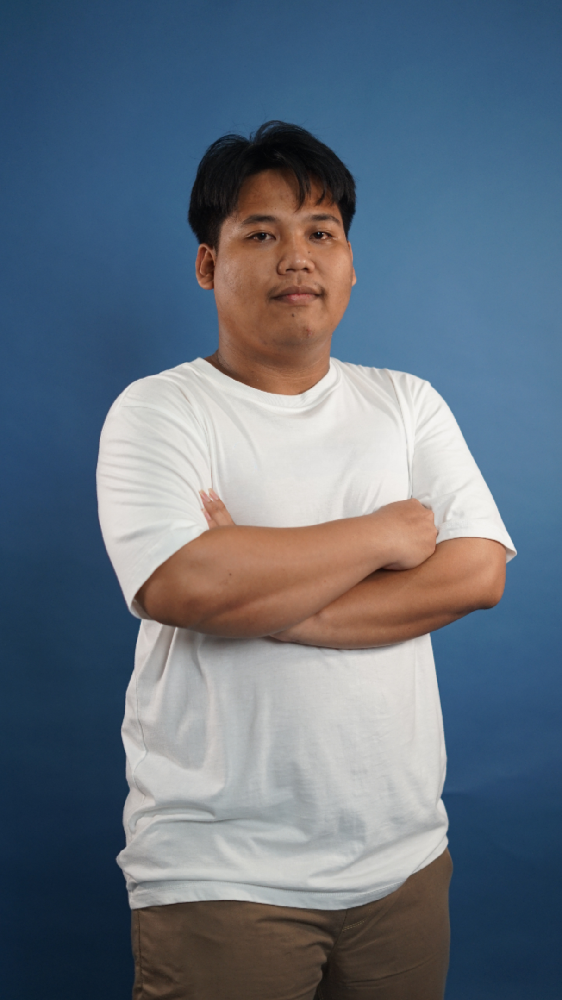

In [86]:
height, width = img.shape[:2]
new_width = width * 2
new_height = height * 2

img_resized = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_LINEAR)
cv2_imshow(img_resized)

# Mengubah gambar menjadi grayscale dan melakukan beberapa transformasi

In [87]:
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

## Transformasi Citra Negatif

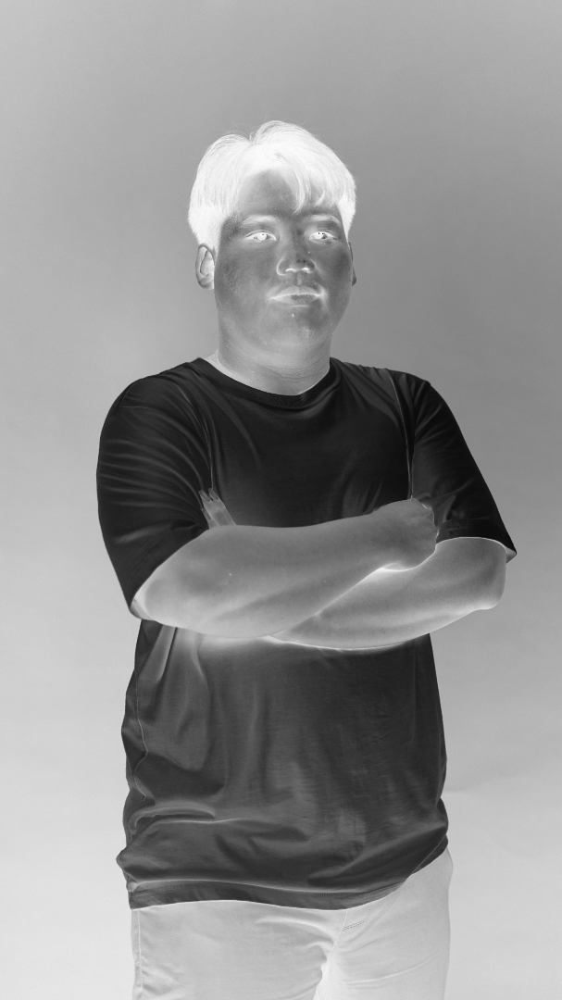

In [88]:
img_negatif = 255 - img_gray
cv2_imshow(img_negatif)

## Proses Konvolusi Blur dan Sharpening

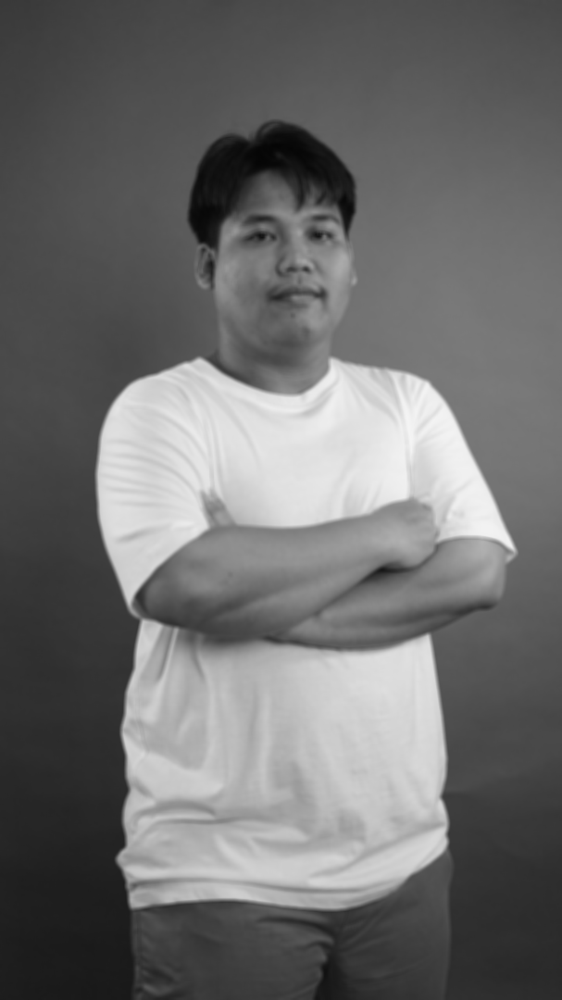

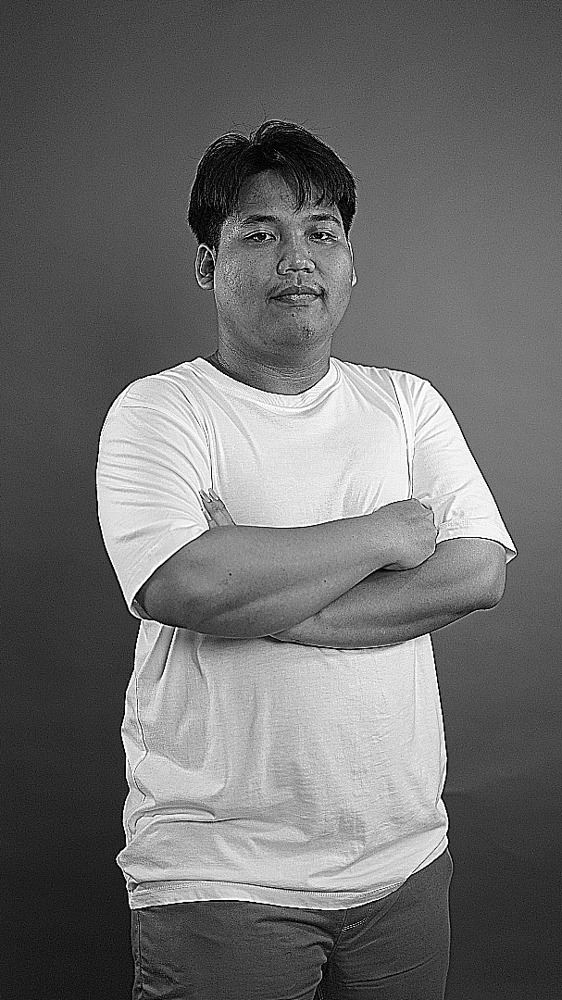

In [89]:
import numpy as np

blur_kernel = np.ones((5, 5), np.float32) / 25
img_blurred = cv2.filter2D(img_gray, -1, blur_kernel)
cv2_imshow(img_blurred)

sharpen_kernel = np.array([[-1, -1, -1],
                           [-1,  9, -1],
                           [-1, -1, -1]])
img_sharpened = cv2.filter2D(img_gray, -1, sharpen_kernel)
cv2_imshow(img_sharpened)

# Menampilkan Operasi Citra

## Menggabungkan Foto Pribadi dengan Pemandangan



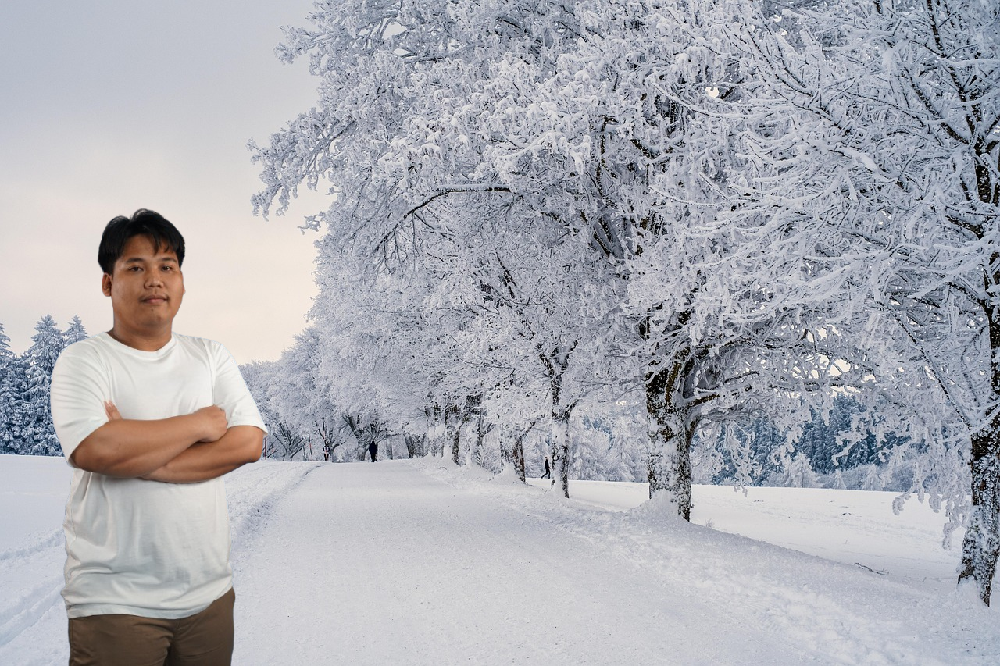

In [90]:
background = cv2.imread("snow.jpg")
fg = cv2.imread("ari.png", cv2.IMREAD_UNCHANGED)

h_bg, w_bg = background.shape[:2]
h_fg, w_fg = fg.shape[:2]

x = 0
y = h_bg - h_fg

roi = background[y:y+h_fg, x:x+w_fg]

alpha = (fg[:, :, 3] / 255.0)[..., None]
fg_rgb = fg[:, :, :3]

composite = fg_rgb * alpha + roi * (1 - alpha)
background[y:y+h_fg, x:x+w_fg] = composite.astype("uint8")

cv2_imshow(background)

## Menggabungkan 3 Foto Bebas

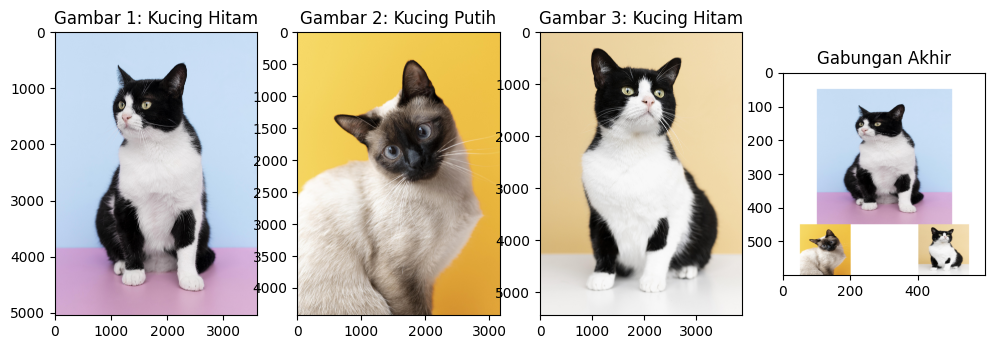

In [91]:
import numpy as np
import matplotlib.pyplot as plt

cat1 = cv2.imread('cat-1.jpg')
cat2 = cv2.imread('cat-2.jpg')
cat3 = cv2.imread('cat-3.jpg')

cat1 = cv2.cvtColor(cat1, cv2.COLOR_BGR2RGB)
cat2 = cv2.cvtColor(cat2, cv2.COLOR_BGR2RGB)
cat3 = cv2.cvtColor(cat3, cv2.COLOR_BGR2RGB)

cat1_resized = cv2.resize(cat1, (400, 400))
cat2_resized = cv2.resize(cat2, (150, 150))
cat3_resized = cv2.resize(cat3, (150, 150))

kanvas = np.ones((600, 600, 3), dtype=np.uint8) * 255

kanvas[50:450, 100:500] = cat1_resized
kanvas[450:600, 50:200] = cat2_resized
kanvas[450:600, 400:550] = cat3_resized

plt.figure(figsize=(12, 4))

plt.subplot(1, 4, 1)
plt.imshow(cat1)
plt.title('Gambar 1: Kucing Hitam')
plt.axis('on')

plt.subplot(1, 4, 2)
plt.imshow(cat2)
plt.title('Gambar 2: Kucing Putih')
plt.axis('on')

plt.subplot(1, 4, 3)
plt.imshow(cat3)
plt.title('Gambar 3: Kucing Hitam')
plt.axis('on')

plt.subplot(1, 4, 4)
plt.imshow(kanvas)
plt.title('Gabungan Akhir')
plt.axis('on')

plt.show()